In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import hvplot.pandas

from segregation import singlegroup, multigroup, dynamics, batch
from geosnap import datasets, Community
from geosnap.analyze import segdyn

OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [2]:
from geosnap.visualize import plot_timeseries

In [3]:
dc = gpd.read_parquet("data/dc_income.parquet")

In [4]:
dc.head()

,geoid,geometry,very_low_inc,low_inc,med_inc,high_inc,very_high_inc,share_very_low_inc,share_low_inc,share_med_inc,share_high_inc,share_very_high_inc,total,year
0,110010010022,"MULTIPOLYGON (((319901.558 4312052.717, 319906...",28.0,112.0,92.0,261.0,282.0,0.036129,0.144516,0.118710,0.336774,0.363871,775.0,2012
1,110010010022,"MULTIPOLYGON (((319901.558 4312052.717, 319906...",36.0,134.0,58.0,204.0,288.0,0.050000,0.186111,0.080556,0.283333,0.400000,720.0,2013
2,110010010022,"MULTIPOLYGON (((319901.558 4312052.717, 319906...",23.0,186.0,65.0,166.0,355.0,0.028931,0.233962,0.081761,0.208805,0.446541,795.0,2014
3,110010010022,"MULTIPOLYGON (((319901.558 4312052.717, 319906...",22.0,223.0,75.0,226.0,299.0,0.026036,0.263905,0.088757,0.267456,0.353846,845.0,2015
4,110010010022,"MULTIPOLYGON (((319901.558 4312052.717, 319906...",21.0,200.0,51.0,190.0,424.0,0.023702,0.225734,0.057562,0.214447,0.478555,886.0,2016


In [5]:
from IPython.display import IFrame

## Spatiotemporal Dynamics in Income Segregation

SubplotGrid(nrows=2, ncols=4, length=8)

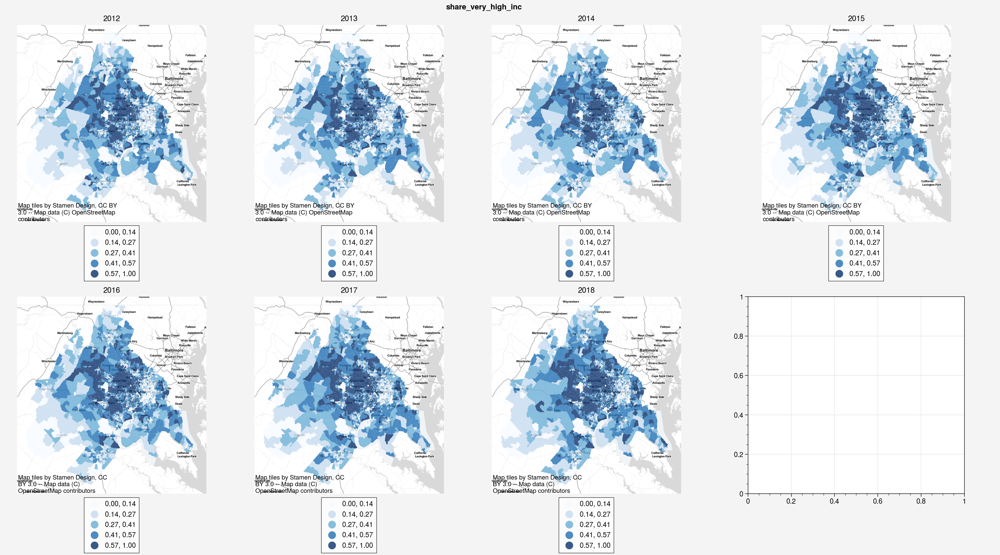

In [6]:
plot_timeseries(dc, 'share_very_high_inc', nrows=2, ncols=4, figsize=(18,10), cmap='Blues', alpha=0.8)

### Temporal Dynamics

#### Multi-Group Indices

In [7]:
cols = ['very_low_inc', 'low_inc', 'med_inc', 'high_inc', 'very_high_inc']

In [8]:
multi_by_time = segdyn.multigroup_tempdyn(dc, cols)

In [9]:
multi_by_time

year,2012,2013,2014,2015,2016,2017,2018
Name,,,,,,,
GlobalDistortion,38.7812,38.2548,36.9974,35.8396,34.4924,32.7230,31.2007
MultiDissim,0.3231,0.3206,0.3180,0.3163,0.3136,0.3127,0.3142
MultiDivergence,0.2097,0.2056,0.2008,0.1981,0.1923,0.1887,0.1858
MultiDiversity,1.5325,1.5286,1.5245,1.5219,1.5155,1.5006,1.4819
MultiGini,0.4465,0.4438,0.4402,0.4378,0.4336,0.4327,0.4345
MultiInfoTheory,0.1368,0.1345,0.1317,0.1302,0.1269,0.1257,0.1253
MultiNormExposure,0.1182,0.1175,0.1161,0.1153,0.1138,0.1145,0.1168
MultiRelativeDiversity,0.1136,0.1125,0.1107,0.1098,0.1079,0.1077,0.1085
MultiSquaredCoefVar,0.1038,0.1019,0.0991,0.0982,0.0956,0.0942,0.0924


<AxesSubplot:xlabel='year'>

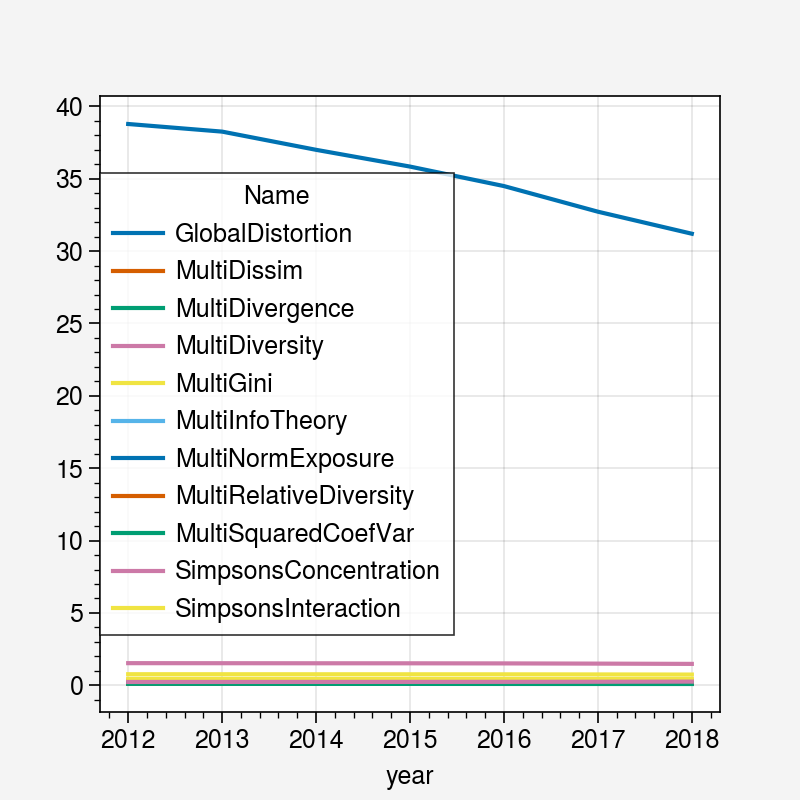

In [10]:
multi_by_time.T.plot()

Most indices are decreasing slightly over time

Text(0.5, 0.98, 'Multigroup Dissimilarity')

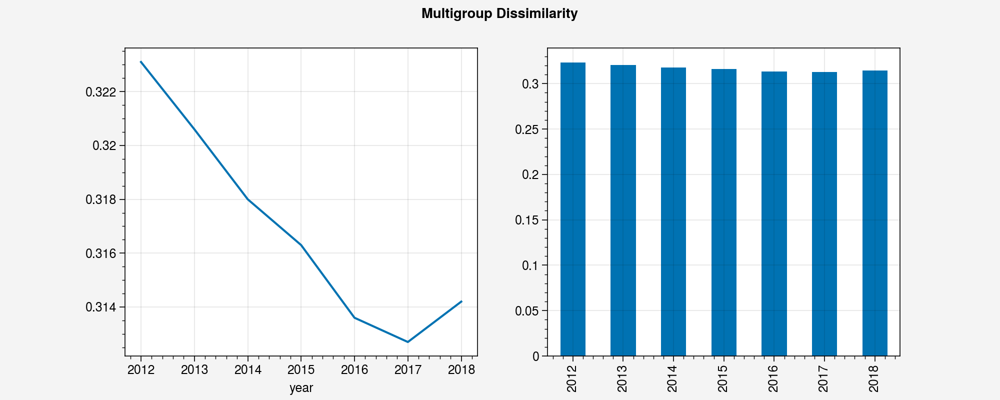

In [11]:
fig, axs = plt.subplots(1,2, figsize=(10,4))

multi_by_time.loc['MultiDissim'].plot(ax=axs[0])
multi_by_time.loc['MultiDissim'].plot(kind='bar', ax=axs[1])

fig.suptitle("Multigroup Dissimilarity")

One that **isn't**, is SimpsonsConcentration, which is increasing over time. Another index that bucks the trend is SimpsonsInteraction, which is decreasing over time (corresponding with an increse in segregation). The divergence between indices tells us that segregation may be changing in different ways across its different dimensions.

Text(0.5, 0.98, "Simpson's Concentration")

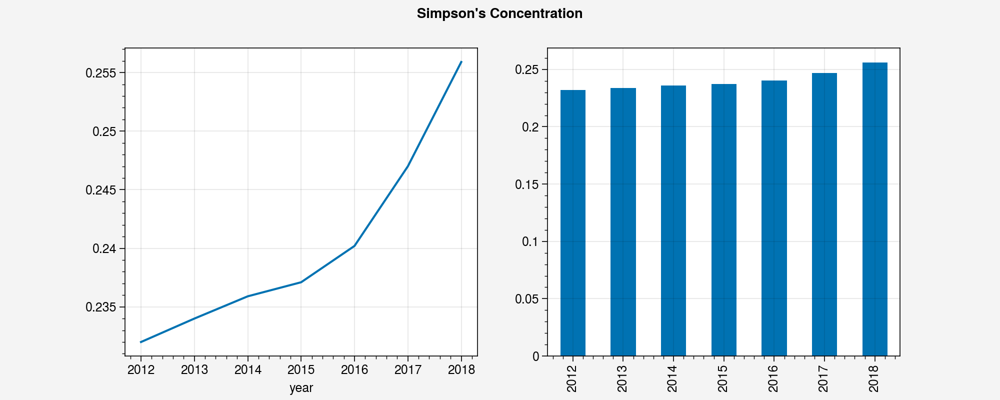

In [12]:
fig, axs = plt.subplots(1,2, figsize=(10,4))

multi_by_time.loc['SimpsonsConcentration'].plot(ax=axs[0])
multi_by_time.loc['SimpsonsConcentration'].plot(kind='bar', ax=axs[1])

fig.suptitle("Simpson's Concentration")

#### Single-Group Indices

In [13]:
from geosnap.analyze.segdyn import singlegroup_tempdyn

In [14]:
singlegroup_tempdyn?

Signature:
singlegroup_tempdyn(
    gdf,
    group_pop_var=None,
    total_pop_var=None,
    time_index='year',
    n_jobs=-1,
    backend='loky',
    **index_kwargs,
)
Docstring:
Batch compute singlegroup segregation indices for each time period in parallel.

Parameters
----------
gdf : geopandas.GeoDataFrame
    geodataframe formatted as a long-form timeseries
group_pop_var : str
    name of column on gdf containing population counts for the group of interest
total_pop_var : str
    name of column on gdf containing total population counts for the unit
time_index : str
    column on the dataframe that denotes unique time periods, by default "year"
n_jobs : int, optional
    number of cores to use for computation. If -1, all available cores will be
    used, by default -1
backend : str, optional
    computation backend passed to joblib. One of {'multiprocessing', 'loky',
    'threading'}, by default "loky"

Returns
-------
geopandas.GeoDataFrame
    dataframe with unique segregation in

In [15]:
segs_single = segdyn.singlegroup_tempdyn(dc, group_pop_var='very_high_inc', total_pop_var='total', )

OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
SpatialProximity: 100%|██████████| 27/27 [00:59<00:00,  2.19s/it]


In [16]:
segs_single

year,2012,2013,2014,2015,2016,2017,2018
Name,,,,,,,
AbsoluteCentralization,0.6979,0.6973,0.6967,0.6972,0.6953,0.6923,0.6899
AbsoluteClustering,0.1258,0.1274,0.1308,0.1324,0.1346,0.1412,0.1504
AbsoluteConcentration,0.6550,0.6497,0.6414,0.6404,0.6265,0.6087,0.5940
Atkinson,0.2569,0.2521,0.2479,0.2445,0.2362,0.2297,0.2276
BiasCorrectedDissim,0.3978,0.3937,0.3909,0.3878,0.3839,0.3791,0.3779
BoundarySpatialDissim,0.2470,0.2424,0.2417,0.2385,0.2355,0.2288,0.2241
ConProf,0.2956,0.2944,0.2948,0.2920,0.2950,0.2988,0.3094
CorrelationR,0.2040,0.2020,0.2003,0.1980,0.1946,0.1929,0.1946
Delta,0.6851,0.6849,0.6837,0.6830,0.6801,0.6780,0.6773


In [17]:
segs_single.T.hvplot(height=600)

:NdOverlay   [Name]
   :Curve   [year]   (value)

<https://www.jstor.org/stable/2579183>

In [18]:
IFrame('https://www.jstor.org/stable/2579183', height=600, width=800)

In [19]:
(segs_single.T[['Gini', 'Entropy', 'Dissim', 'Atkinson']].hvplot(title='Evenness Dimension', width=380, height=400).opts(legend_position='bottom', show_grid=True) +
segs_single.T[['AbsoluteConcentration', 'RelativeConcentration' , 'Delta']].hvplot(title='Concentration Dimension', width=380, height=400).opts(legend_position='bottom', show_grid=True) +
segs_single.T[['AbsoluteClustering', 'Isolation', 'CorrelationR', 'Interaction', 'SpatialProxProf']].hvplot(title='Exposure/Clustering Dimension', width=380, height=400).opts(legend_position='bottom', show_grid=True))


:Layout
   .NdOverlay.I   :NdOverlay   [Name]
      :Curve   [year]   (value)
   .NdOverlay.II  :NdOverlay   [Name]
      :Curve   [year]   (value)
   .NdOverlay.III :NdOverlay   [Name]
      :Curve   [year]   (value)

In [20]:
segs_single.T[['AbsoluteClustering', 'Isolation', 'SpatialProxProf', 'Interaction']].pct_change(periods=5) # we should only compare non-overlapping intervals

Name,AbsoluteClustering,Isolation,SpatialProxProf,Interaction
year,,,,
2012,NaN,NaN,NaN,NaN
2013,NaN,NaN,NaN,NaN
2014,NaN,NaN,NaN,NaN
2015,NaN,NaN,NaN,NaN
2016,NaN,NaN,NaN,NaN
2017,0.122417,0.051879,0.176061,-0.045711
2018,0.180534,0.079009,0.218983,-0.070657


Between the sampling periods 2008-2012 and 2013-2017:
- the isolation index increased by 5.2%
- the absolute clustering index increased by 12.4%.  
- the spatial proximity profile increased by 17.6%

Between the sampling periods 2009-2013 and 2014-2018:
- the isolation index increased by 7.9%
- the absolute clustering index increased by 18.2%
- the spatial proximity profile increased by 21.9%

### Space-Time Dynamics

In [21]:
from segregation.singlegroup import Entropy

In [22]:
d = segdyn.spacetime_dyn(dc, singlegroup.Entropy, group_pop_var='very_high_inc', total_pop_var='total', distances=list(range(500,5500,500)))

OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


<AxesSubplot:xlabel='distance'>

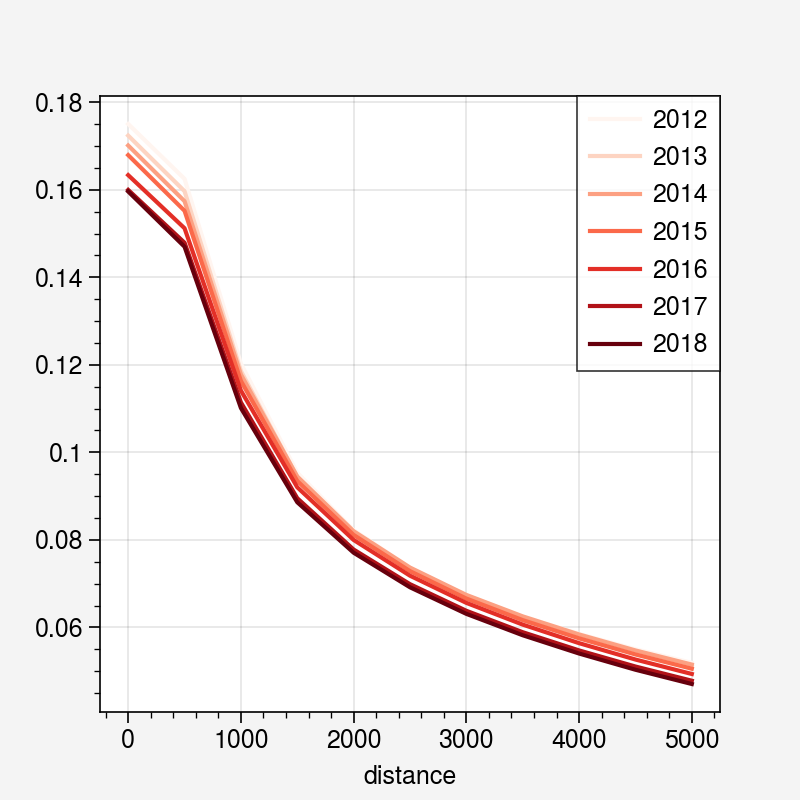

In [23]:
d.plot(cmap='Reds')

Entropy is falling the fastest at small scales

In [24]:
iso = segdyn.spacetime_dyn(dc, singlegroup.Isolation, group_pop_var='very_high_inc', total_pop_var='total', distances=list(range(500,5500,500)))

OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


<AxesSubplot:xlabel='distance'>

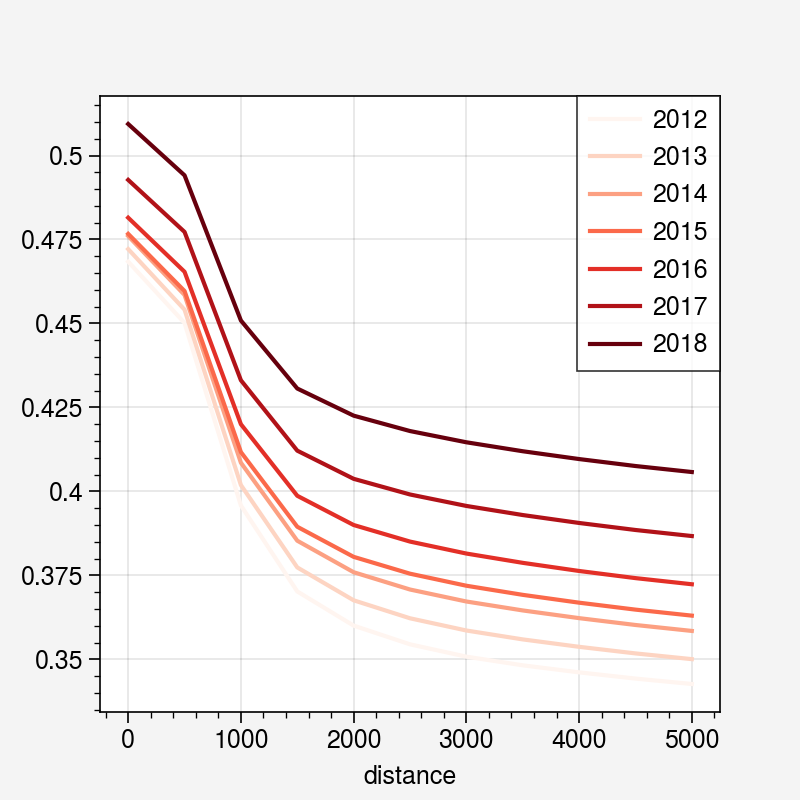

In [25]:
iso.plot(cmap='Reds')

Isolation is growing the fastest at large scales

In [26]:
from geosnap.visualize import animate_timeseries

In [ ]:
animate_timeseries(dc, 'share_very_high_inc', filename='figs/dc_high_inc_change.gif', fps=1.5)

In [28]:
from IPython.display import Image

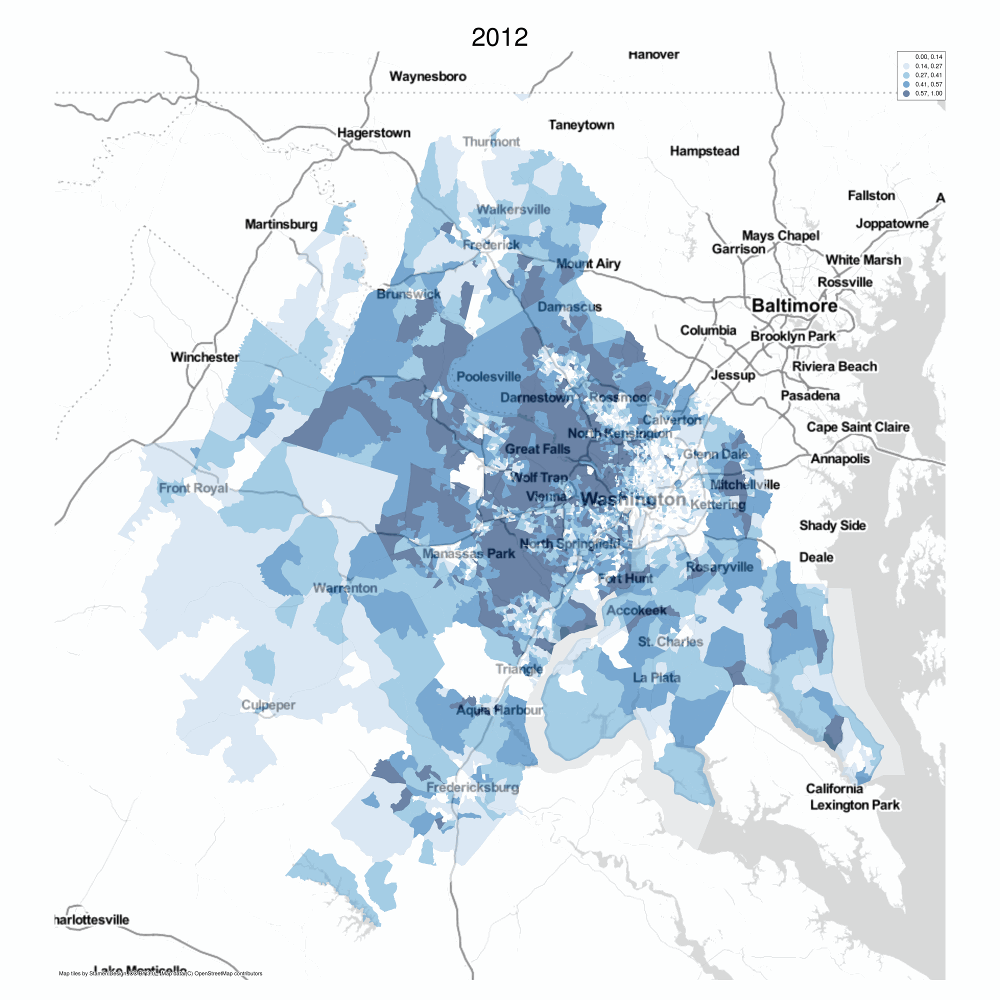

In [29]:
Image('figs/dc_high_inc_change.gif',width=800)

The story in DC is one of increasing isolation by the affluent at large spatial scales. 

By many metrics, the region appears to be becoming *less* segregated by income over time, but that increase in evenness is largely due to the entire region getting richer. By contrast, looking at the exposure dimension shows that the residents with the highest incomes spend increasingly less time in environments with other income groups, and that change is happening quickest at large spatial scales. Put differently, we see a trend akin to agglomeration, whereby the large wealthy enclaves are becoming moreso

(remember this is example makes some *very* liberal assumptions about the input data, so the "takeaways" here are just for illustration)